In [58]:
# libraries 
import random
from numpy import zeros,linspace,std,arange,sqrt,log, log2, vectorize,meshgrid, diag,zeros_like
from math import e
from matplotlib.pyplot import title,subplots,MaxNLocator,close,tight_layout, xticks,yticks,fill_between,figure,xscale,axvline,yscale,grid,annotate,plot,show,hist,hist2d,axes,scatter,legend,xlabel,ylabel,errorbar,xlim,colorbar,imshow
from scipy.optimize import curve_fit
from scipy.stats import norm
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.lines import Line2D
import matplotlib.pyplot as plt

# 1) Szilard Engine Simulation

In [59]:
def net_work(M,N,divisions,weights,pE,pA,epsilon): 
    # M = total number of trayectories
    # N = total number of cycles
    # pE = probability of thin division
    # pA = probability of wide division 
    # epsilon = error in the measurement 
    
    # We create an array to store the value of the net work after each cycle 
    wnet = zeros((M,N)) 
    
    for t in range(M): 
        for d in range(N):
            # Use random.choices() to pick the partciles position based on the specified weights
            particle_position = random.choices(divisions, weights, k=1)[0]

            if particle_position % 2 == 0: 
                # particle is an even division (wide division)
                if random.random()<2*epsilon: 
                    # in this case we need to perform work, we measure particle in an adjacent odd division
                    wnet[t,d]=wnet[t,d-1]+log(epsilon/(pE+2*epsilon*(pA-pE))) 
                
                else: 
                    # in this case we extract work, we measure the correct division
                    wnet[t,d]=wnet[t,d-1]+log((1-2*epsilon)/(pA-2*epsilon*(pA-pE)))
       
                
            else: 
                # particle is in an odd division (thin division)
                if random.random()<2*epsilon:
                    # in this case we need to perform work, we measure particle in an adjacent even division
                    wnet[t,d]=wnet[t,d-1]+log(epsilon/(pA-2*epsilon*(pA-pE))) 
                    
                else:
                    # in this case we extract work, we measure the correct division
                    wnet[t,d]=wnet[t,d-1]+log((1-2*epsilon)/(pE+2*epsilon*(pA-pE))) 
               
    return wnet

## 1.1) 10 Divisions with pE=0.05 and pA=0.15 (Equal error)

In [35]:
M=100000 # number of trajectories 
N=1000 # number of cycles 
pE=0.05 # probability of thin division
pA=0.15 # probability of wide division
epsilon=0.1

# Define your list of options
divisions = [1,2,3,4,5,6,7,8,9,10]

# Define the corresponding weights for each option
weights = [1,pA/pE,1,pA/pE,1,pA/pE,1,pA/pE,1,pA/pE] 

wnet=net_work(M,N,divisions,weights,pE,pA,epsilon)

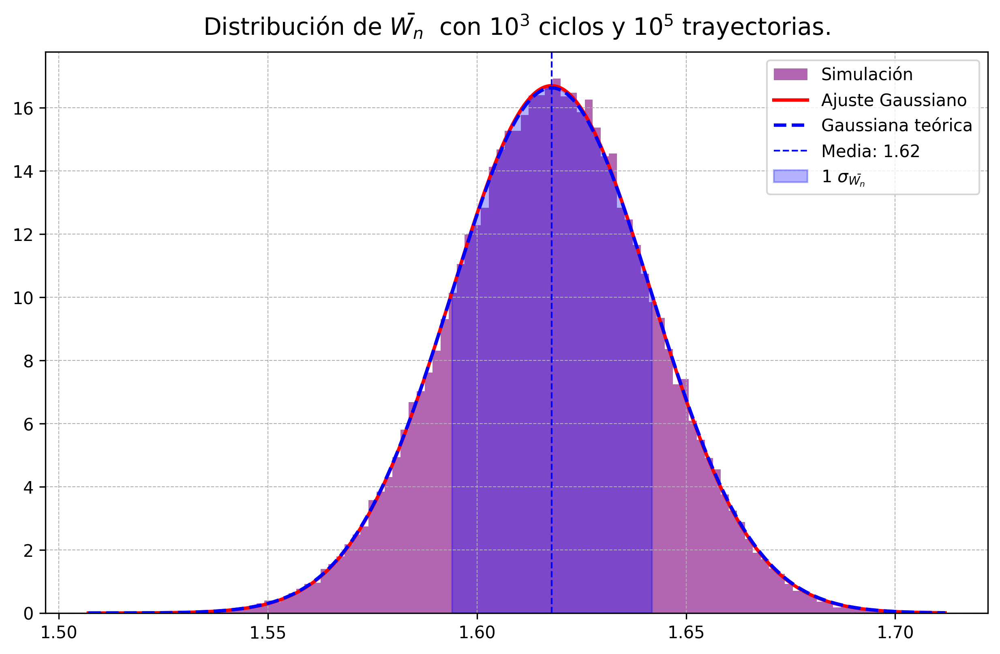

The average of the distribution is 1.6178239080430177 and the standard deviation is 0.02388816973076185.


In [36]:
# In order to study the distribution, let us take the value of the net work after the last cycle 
# and divide it by the number of cycles. In doing so we will yield an approximated value of the expected
# work extracted after each cycle.

# Figure size
figure(figsize=(10, 6), dpi=300)

# Plot histogram
n, bins, patches = hist(wnet[:, -1] / N, bins=107, density=True, alpha=0.6, color='purple', label="Simulación")

# Plot Gaussian approximation
# Let us compute the standard deviation and mean 
mu_1, sigma_1 = norm.fit(wnet[:, -1] / N)
xmin=min(wnet[:,-1]/N)
xmax=max(wnet[:,-1]/N)
xlin = linspace(xmin, xmax, 1000)
plot(xlin, norm.pdf(xlin, mu_1, sigma_1), color='red', linewidth=2, label="Ajuste Gaussiano")

# Plot theoretical Gaussian
plot(xlin, norm.pdf(xlin, 1.6178526918185563, sqrt(0.57535148168029/1000)), color='blue', linestyle='dashed', linewidth=2, label="Gaussiana teórica")

# Add vertical lines for means
axvline(x=1.6178526918185563, color='blue', linestyle='--',linewidth=1 ,label=f'Media: {1.6178526918185563:.2f}')

# Add horizontal lines for standard deviations
fill_between(xlin, 0, norm.pdf(xlin, 1.6178526918185563, sqrt(0.57535148168029/1000)), where=((xlin > 1.6178526918185563 - sqrt(0.57535148168029/1000)) & (xlin < 1.6178526918185563 + sqrt(0.57535148168029/1000))), color='blue', alpha=0.3, label=r'1 $\sigma_{\bar{W_n}}$')

# Add grid, legend, title and adjust ticks for better readability
plt.title(r"Distribución de $\bar{W_n}$  con $10^3$ ciclos y $10^5$ trayectorias.", fontsize=14,pad=10)
grid(True, which='both', linestyle='--', linewidth=0.5)
legend(fontsize=10)
xticks(fontsize=10)
yticks(fontsize=10)

# Show plot
show()

# Print the average and standard deviation of the distribution
print(f"The average of the distribution is {mu_1} and the standard deviation is {sigma_1}.")

A = 0.5722041519322792 ± 4.711393659807802e-05


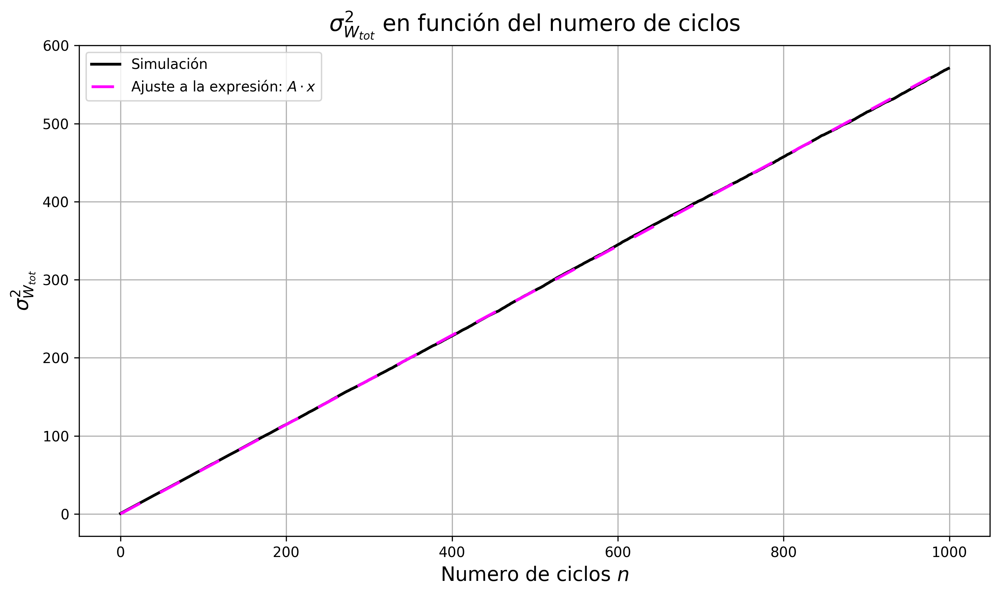

In [38]:
# Standard deviation squared as a fucntion of the cycles 
STD=[] 

for i in range(N):
    STD.append(std(wnet[:,i])**2)

# Function used for the fitting
def f(x,A):
    return A*x

# Results of the fitting
STDcomp=arange(N)
popt,cov=curve_fit(f,arange(N),STD) 
A=popt[0]
stderr = sqrt(diag(cov))
print(f"A = {A} ± {stderr[0]}")

# Graphical represenattion
figure(figsize=(10, 6), dpi=300)
x=arange(N)
plot(x,STD,'black',linewidth=2,label="Simulación")
plot(x,f(x,A),"--", color='magenta',label=r"Ajuste a la expresión: $A\cdot x$", linewidth=2, dashes=[8, 8])
xlabel("Numero de ciclos $n$", fontsize=14)
ylabel(r"$\sigma_{W_{tot}}^2$", fontsize=14)
plt.title(r"$\sigma_{W_{tot}}^2$ en función del numero de ciclos", fontsize=16,pad=10)
legend()
grid(True)
tight_layout()
show()

## 1.2) Theoretical expression of $\frac{\langle W\rangle}{kT}$ as a function of pE, pA, and epsilon (Equal error)

In [6]:
def WKTsurface(pE, epsilon):
    pA = (1/5 - pE)
    Wkt = -1 / ((1/5 - pE) + pE) * (-pE * 2 * epsilon * log(epsilon / ((1/5 - pE) - 2 * epsilon * ((1/5 - pE) - pE))) -(1/5 - pE) * (1 - 2 * epsilon) * log((1 - 2 * epsilon) / ((1/5 - pE) - 2 * epsilon * ((1/5 - pE) - pE))) -(1/5 - pE) * 2 * epsilon * log(epsilon / (pE + 2 * epsilon * ((1/5 - pE) - pE))) -pE * (1 - 2 * epsilon) * log((1 - 2 * epsilon) / (pE + 2 * epsilon * ((1/5 - pE) - pE))))
    return Wkt

# Create a grid of pE and epsilon values
pE = linspace(10**(-10), 1/5-10**(-10), 1000)
epsilon = linspace(10**(-10), 1/3, 1000)
pE_grid, epsilon_grid = meshgrid(pE, epsilon)

# Compute WKT values over the grid
WKT_values = vectorize(WKTsurface)(pE_grid, epsilon_grid)

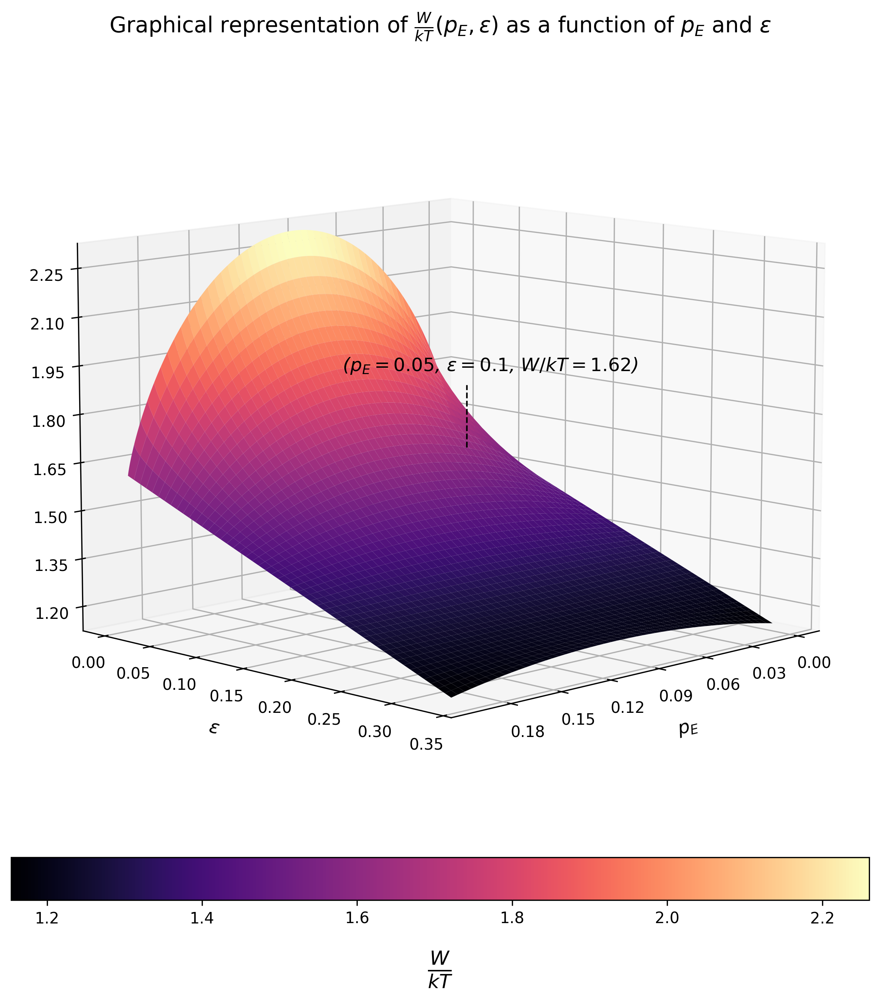

In [39]:
# Plotting
close('all')
fig = figure(figsize=(12, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')
surface=ax.plot_surface(pE_grid, epsilon_grid, WKT_values, cmap='magma')

# Annotate the point studied (p_E=0.05; epsilon=0.1)
ax.text(0.125, 0.09, WKTsurface(0.05, 0.1)+0.3, ' ($p_E=0.05$, $\\epsilon=0.1$, $W/kT=1.62$)', color='black', style='italic', fontsize=12,zorder=5)
ax.plot([0.05, 0.05], [0.1, 0.1], [WKTsurface(0.05, 0.1), WKTsurface(0.05, 0.1)+0.2], 'black', linestyle="--", linewidth=1, zorder=4)  # Line to the text

# Set the viewing angle
ax.view_init(elev=10, azim=45)  
ax.set_xlabel(r'$p_E$',labelpad=10, fontsize=12)
ax.set_ylabel(r'$\epsilon$',labelpad=10, fontsize=12)
plt.title = ax.set_title(r'Graphical representation of $\frac{W}{kT}(p_E, \epsilon)$ as a function of $p_E$ and $\epsilon$', fontsize=14)

cbar = fig.colorbar(surface, ax=ax, orientation='horizontal', pad=0, fraction=0.05)
cbar.set_label(r"$\frac{W}{kT}$", rotation=0, labelpad=15, fontsize=18)
ax.xaxis.set_major_locator(MaxNLocator(8))
ax.yaxis.set_major_locator(MaxNLocator(8))
#ax.yaxis.set_major_formatter(plt.NullFormatter())
ax.zaxis.set_major_locator(MaxNLocator(8))

show()

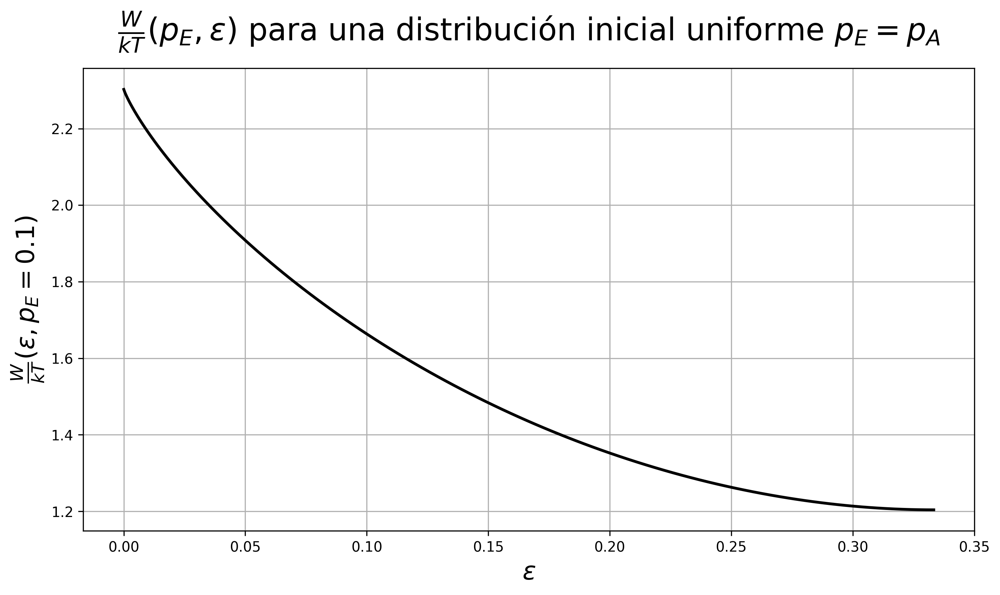

In [8]:
# Limit case pE=0.1
def limWktpE01(epsilon):
    return -1.386294362*epsilon + 2.000000000*epsilon*log(epsilon) + 2.995732274 + 1.000000000*log(0.5000000000 - 1.000000000*epsilon) - 2.000000000*epsilon*log(0.5000000000 - 1.000000000*epsilon)

close('all')
figure(figsize=(10, 6), dpi=300)
plot(epsilon,limWktpE01(epsilon),'black',linewidth=2)
xlabel("$\epsilon$", fontsize=18)
ylabel(r"$\frac{W}{kT}(\epsilon,p_E=0.1)$", fontsize=18)
plt.title(r"$\frac{W}{kT}(p_E, \epsilon)$ para una distribución inicial uniforme $p_E=p_A$", fontsize=22,pad=20)
grid(True)
tight_layout()
show()

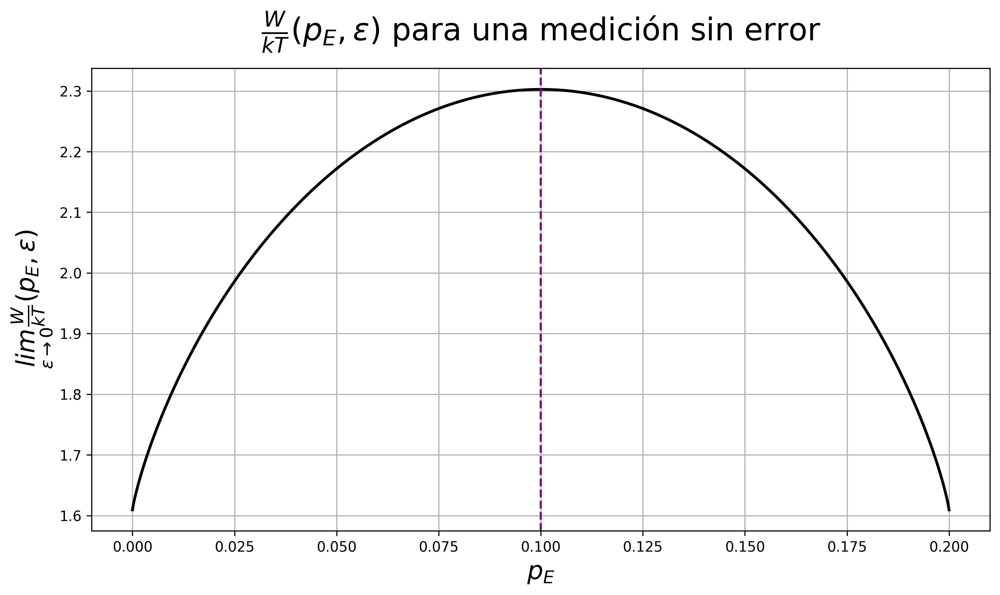

In [9]:
# Limit case epsilon=0
def limWkteps0(pE):
    return -5*pE*log(5) - 5*pE*log(-1/(5*pE - 1)) + 5*pE*log(1/pE) + log(5) + log(-1/(5*pE - 1))

figure(figsize=(10, 6), dpi=300)
plot(pE,limWkteps0(pE),'black',linewidth=2)
xlabel("$p_E$", fontsize=18)
axvline(x=0.1, color='purple', linestyle='--', label='Maximo en $p_E=0.1$')
ylabel(r"$\underset{\epsilon \rightarrow 0}{lim}\frac{W}{kT}(p_E, \epsilon)$", fontsize=18)
plt.title(r"$\frac{W}{kT}(p_E, \epsilon)$ para una medición sin error", fontsize=22,pad=20)
grid(True)
tight_layout()
show()

## 1.3) Theoretical expression of $\sigma_W^2$ as a function of pE, pA, and epsilon (Equal error)

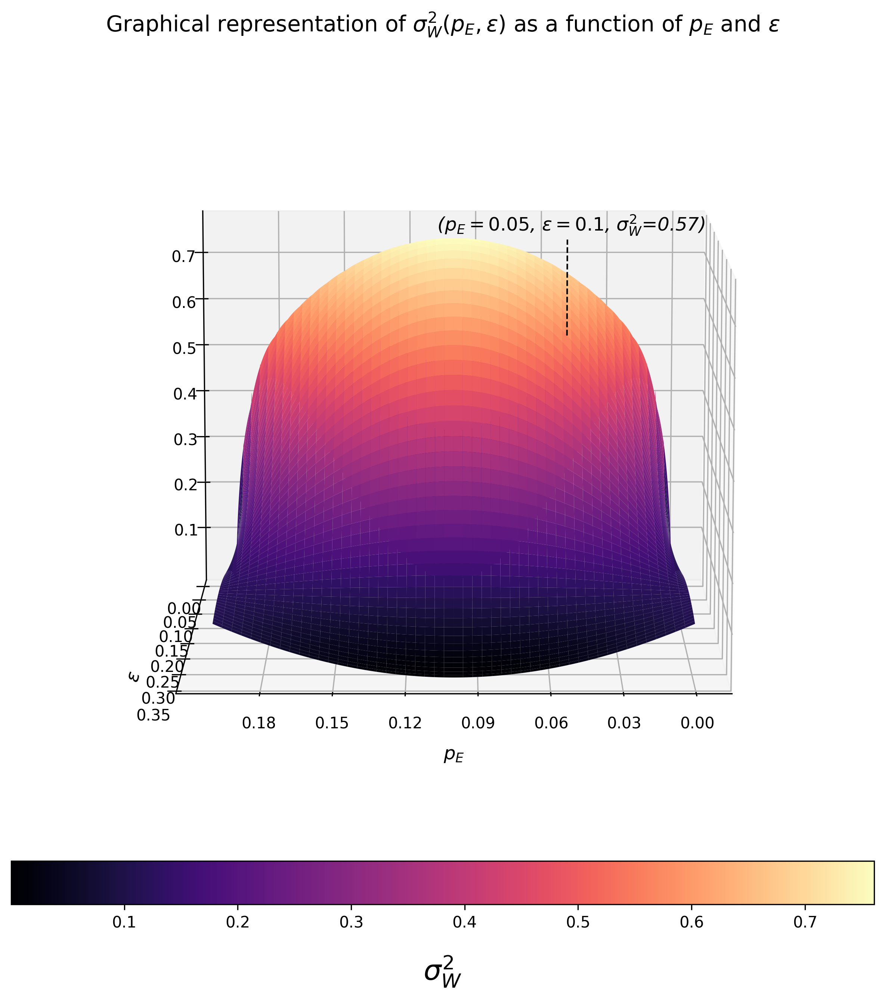

In [10]:
def sigmasurface(pE, epsilon):
    pA = 1/5 - pE
    sigma2= -1/((1/5-pE)+pE)*(-pE*2*epsilon*(log(epsilon/((1/5-pE)-2*epsilon*((1/5-pE)-pE))))**2-(1/5-pE)*(1-2*epsilon)*(log((1-2*epsilon)/((1/5-pE)-2*epsilon*((1/5-pE)-pE))))**2-(1/5-pE)*2*epsilon*(log(epsilon/(pE+2*epsilon*((1/5-pE)-pE))))**2-pE*(1-2*epsilon)*(log((1-2*epsilon)/(pE+2*epsilon*((1/5-pE)-pE))))**2)-(-1/((1/5-pE)+pE)*(-pE*2*epsilon*log(epsilon/((1/5-pE)-2*epsilon*((1/5-pE)-pE)))-(1/5-pE)*(1-2*epsilon)*log((1-2*epsilon)/((1/5-pE)-2*epsilon*((1/5-pE)-pE)))-(1/5-pE)*2*epsilon*log(epsilon/(pE+2*epsilon*((1/5-pE)-pE)))-pE*(1-2*epsilon)*log((1-2*epsilon)/(pE+2*epsilon*((1/5-pE)-pE)))))**2
    return sigma2

# Compute sigma values over the grid
sigma_values = vectorize(sigmasurface)(pE_grid, epsilon_grid)

# Plotting
close('all')
fig = figure(figsize=(12, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')
surface2=ax.plot_surface(pE_grid, epsilon_grid, sigma_values, cmap='magma')

# Annotate the point studied (p_E=0.05; epsilon=0.1)
ax.text(0.11, 0.05, sigmasurface(0.05, 0.1)+0.2, ' ($p_E=0.05$, $\\epsilon=0.1$, $\sigma_W^2$=0.57)', color='black', style='italic', fontsize=12,zorder=5)
ax.plot([0.05, 0.05], [0.1, 0.1], [sigmasurface(0.05, 0.1), sigmasurface(0.05, 0.1)+0.2], 'black', linestyle="--", linewidth=1, zorder=4)  

# Set the viewing angle
ax.view_init(elev=10, azim=90)  # Adjust these values to change the perspective
ax.set_xlabel(r'$p_E$',labelpad=10, fontsize=12)
ax.set_ylabel(r'$\epsilon$',labelpad=10, fontsize=12)
title = ax.set_title(r'Graphical representation of $\sigma_W^2(p_E, \epsilon)$ as a function of $p_E$ and $\epsilon$', fontsize=14)

cbar = fig.colorbar(surface2, ax=ax, orientation='horizontal', pad=0, fraction=0.05)
cbar.set_label(r"$\sigma_W^2$", rotation=0, labelpad=15, fontsize=18)
ax.xaxis.set_major_locator(MaxNLocator(8))
ax.yaxis.set_major_locator(MaxNLocator(8))
ax.zaxis.set_major_locator(MaxNLocator(8))

show()

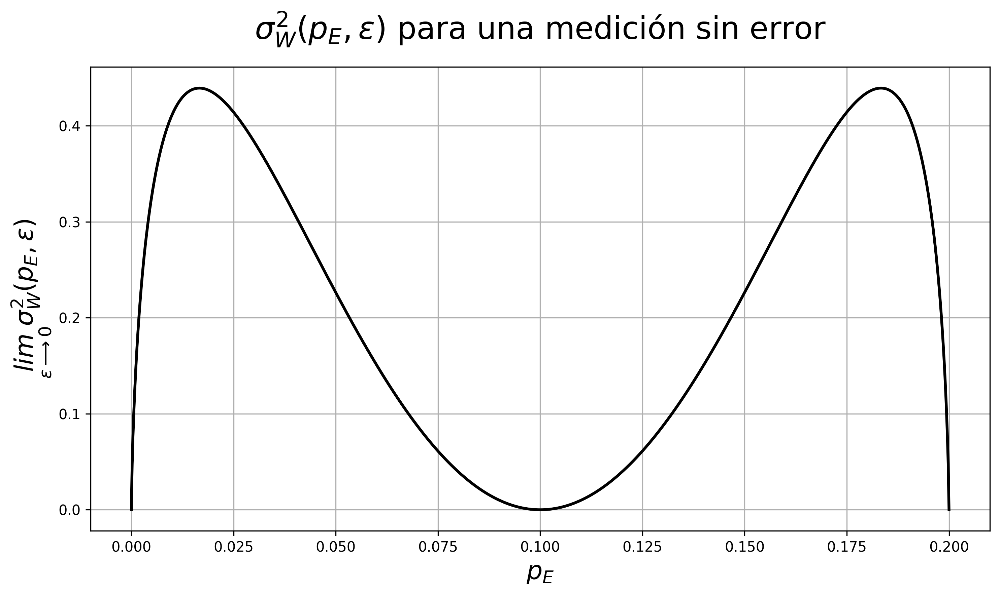

In [11]:
# Limit case epsilon=0
def limeps0(pE):
    return 50*log(1/pE)*pE**2*log(5) + 50*log(1/pE)*pE**2*log(-1/(5*pE - 1)) - 10*log(1/pE)*pE*log(5) - 10*log(1/pE)*pE*log(-1/(5*pE - 1)) - 25*pE**2*log(5)**2 - 50*pE**2*log(5)*log(-1/(5*pE - 1)) - 25*pE**2*log(-1/(5*pE - 1))**2 - 25*log(1/pE)**2*pE**2 + 5*pE*log(5)**2 + 10*pE*log(5)*log(-1/(5*pE - 1)) + 5*pE*log(-1/(5*pE - 1))**2 + 5*pE*log(1/pE)**2

close('all')
figure(figsize=(10, 6), dpi=300)
plot(pE,limeps0(pE),'black',linewidth=2)
xlabel("$p_E$", fontsize=18)
ylabel(r"$\underset{\epsilon \longrightarrow 0}{lim}\sigma_W^2(p_E, \epsilon)$", fontsize=18)
plt.title(r"$\sigma_W^2(p_E, \epsilon)$ para una medición sin error", fontsize=22,pad=20)
grid(True)
tight_layout()
show()

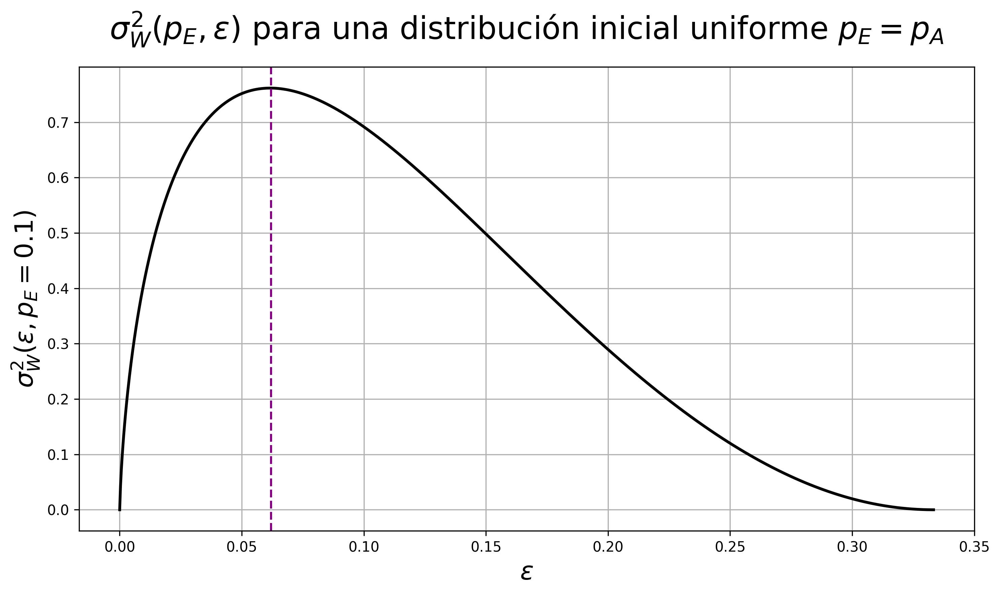

In [12]:
# Limit case pE=0.1
def limpE01(epsilon):
    return 0.96090602*epsilon + 2.772588728*epsilon*log(0.5000000000 - 1.000000000*epsilon) - 2.772588728*epsilon*log(epsilon) - 4.000000000*epsilon*log(epsilon)*log(0.5000000000 - 1.000000000*epsilon) - 1.92181205*epsilon**2 - 5.54517745*epsilon**2*log(0.5000000000 - 1.000000000*epsilon) + 5.54517745*epsilon**2*log(epsilon) + 8.000000000*epsilon**2*log(epsilon)*log(0.5000000000 - 1.000000000*epsilon) - 4.000000000*epsilon**2*log(epsilon)**2 + 2.000000000*epsilon*log(0.5000000000 - 1.000000000*epsilon)**2 - 4.000000000*epsilon**2*log(0.5000000000 - 1.000000000*epsilon)**2 + 2.000000000*epsilon*log(epsilon)**2

close('all')
figure(figsize=(10, 6), dpi=300)
plot(epsilon,limpE01(epsilon),'black',linewidth=2)
xlabel("$\epsilon$", fontsize=18)
ylabel(r"$\sigma_W^2(\epsilon,p_E=0.1)$", fontsize=18)
axvline(x=0.062, color='purple', linestyle='--', label='Maximo en $\epsilon=0.062$')
plt.title(r"$\sigma_W^2(p_E, \epsilon)$ para una distribución inicial uniforme $p_E=p_A$", fontsize=22,pad=20)
grid(True)
tight_layout()
show()

## 1.4) Theoretical expression of $\frac{I(X,Y)}{k}$ as a function of pE, pA, and epsilon (Equal error)

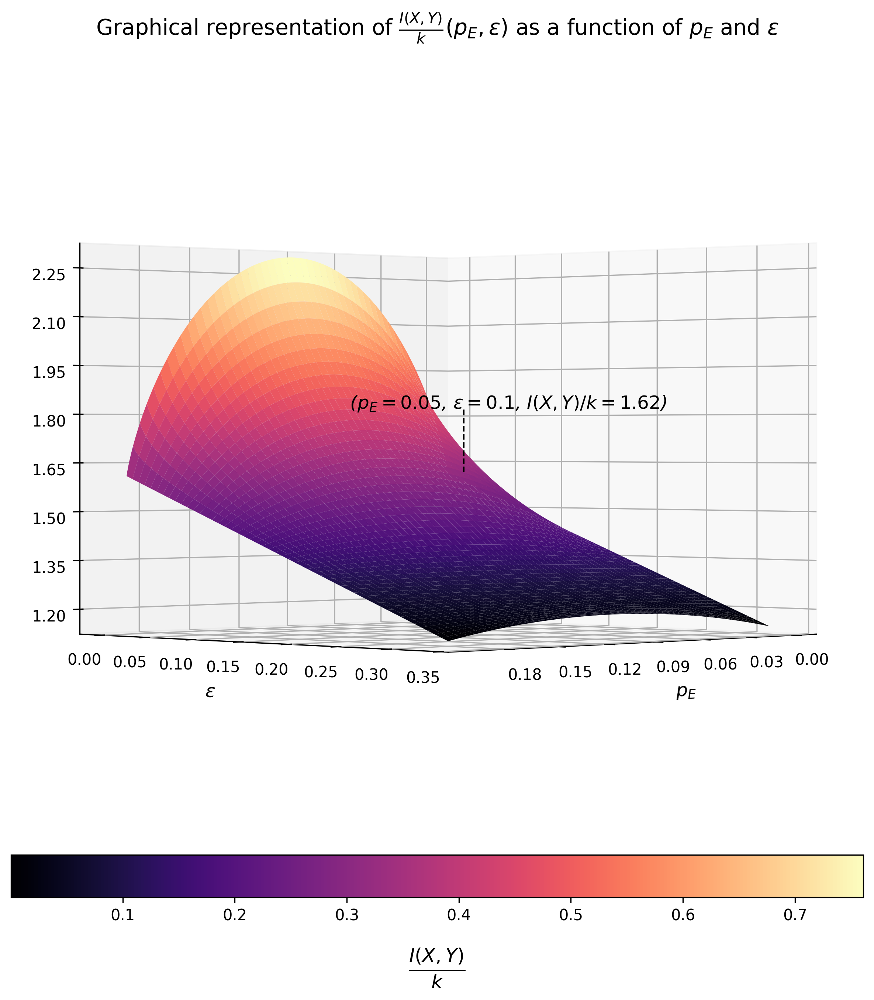

In [13]:
# Let us now check that the mutual information coincides with the expected work extracted per cycle 
def IXY(pE,epsilon):
    pA=1/5-pE
    i = -1/(pA+pE)*(pA*log(pA)+pE*log(pE)-2*epsilon*pE*log(epsilon*pE/(pA-2*epsilon*(pA-pE)))-(1-2*epsilon)*pA*log((1-2*epsilon)*pA/(pA-2*epsilon*(pA-pE)))-(1-2*epsilon)*pE*log((1-2*epsilon)*pE/(pE+2*epsilon*(pA-pE)))-2*epsilon*pA*log(epsilon*pA/(pE+2*epsilon*(pA-pE))))
    return i

IXY_values = vectorize(IXY)(pE_grid, epsilon_grid)

# Plotting
close('all')
fig = figure(figsize=(12, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')
surface3=ax.plot_surface(pE_grid, epsilon_grid, IXY_values, cmap='magma')

# Annotate the point
ax.text(0.125, 0.1, IXY(0.05, 0.1)+0.2, ' ($p_E=0.05$, $\\epsilon=0.1$, $I(X,Y)/k=1.62$)', color='black', style='italic', fontsize=12,zorder=5)
ax.plot([0.05, 0.05], [0.1, 0.1], [IXY(0.05, 0.1), IXY(0.05, 0.1)+0.2], 'black', linestyle="--", linewidth=1, zorder=4)  


# Set the viewing angle
ax.view_init(elev=0, azim=45)  # Adjust these values to change the perspective
ax.set_xlabel(r'$p_E$',labelpad=10, fontsize=12)
ax.set_ylabel(r'$\epsilon$',labelpad=10, fontsize=12)
title = ax.set_title(r'Graphical representation of $\frac{I(X,Y)}{k}(p_E, \epsilon)$ as a function of $p_E$ and $\epsilon$', fontsize=14)

cbar = fig.colorbar(surface2, ax=ax, orientation='horizontal', pad=0, fraction=0.05)
cbar.set_label(r"$\frac{I(X,Y)}{k}$", rotation=0, labelpad=15, fontsize=18)
ax.xaxis.set_major_locator(MaxNLocator(8))
ax.yaxis.set_major_locator(MaxNLocator(8))
ax.zaxis.set_major_locator(MaxNLocator(8))

show()

# 2) Horse Race Simulation

In [14]:
def Kelly(M,N,horses,weights,pE,pA,epsilon): 
    # M = total number of trayectories
    # N = total number of consecutive horse races
    # pE = probability of odd horses
    # pA = probability of even horses 
    # epsilon = error in the prediction 
    
    # w_in = inicial wealth of 1 dollar
    w_in=zeros(M)+1
    
    # We create an array to store the value of the wealth after each race 
    wealth=zeros((M,N+1)) 
    wealth[:,0]=w_in
    
    for t in range(M):
        for d in range(1,N+1):
            
            # Use random.choices() to pick the winning horse based on the specified weights
            winning_horse = random.choices(horses, weights, k=1)[0]

            if winning_horse % 2 == 0:
                # even horse wins
                if random.random()<2*epsilon:
                    # we have bet on odd adjacent horse (we lose money)
                    wealth[t,d]=wealth[t,d-1]*1/(pE+2*epsilon*(pA-pE))*epsilon*pA*1/pA
                else: 
                    # we have bet on the winning horse (we win money)
                    wealth[t,d]=wealth[t,d-1]*1/(pA-2*epsilon*(pA-pE))*(1-2*epsilon)*pA*1/pA

            else:
                # odd horse wins
                if random.random()<2*epsilon:
                    # we have bet on even adjacent horse (we lose money)
                    wealth[t,d]=wealth[t,d-1]*1/(pA-2*epsilon*(pA-pE))*epsilon*pE*1/pE
                else:
                    # expected horse wins (we win money)
                    wealth[t,d]=wealth[t,d-1]*1/(pE+2*epsilon*(pA-pE))*(1-2*epsilon)*pE*1/pE
               
    return wealth

## 2.1) 10 Horses with pE=0.05 and pA=0.15 (Equal error)

In [27]:
M=1000000 # number of trajectories 
N=250 # number of cycles 
pE=0.05 # probability of odd horse
pA=0.15 # probability of even horse
epsilon=0.1

# Define your list of options
horses = [1,2,3,4,5,6,7,8,9,10]

# Define the corresponding weights for each option
weights = [1,pA/pE,1,pA/pE,1,pA/pE,1,pA/pE,1,pA/pE] 

wealth=Kelly(M,N,horses,weights,pE,pA,epsilon)

In this case we want to study the distribution of the doubling rate; where
$$S_{n}=e^{nW} \rightarrow W=\frac{log(S_{n})}{n}$$
where W is the doubling rate.

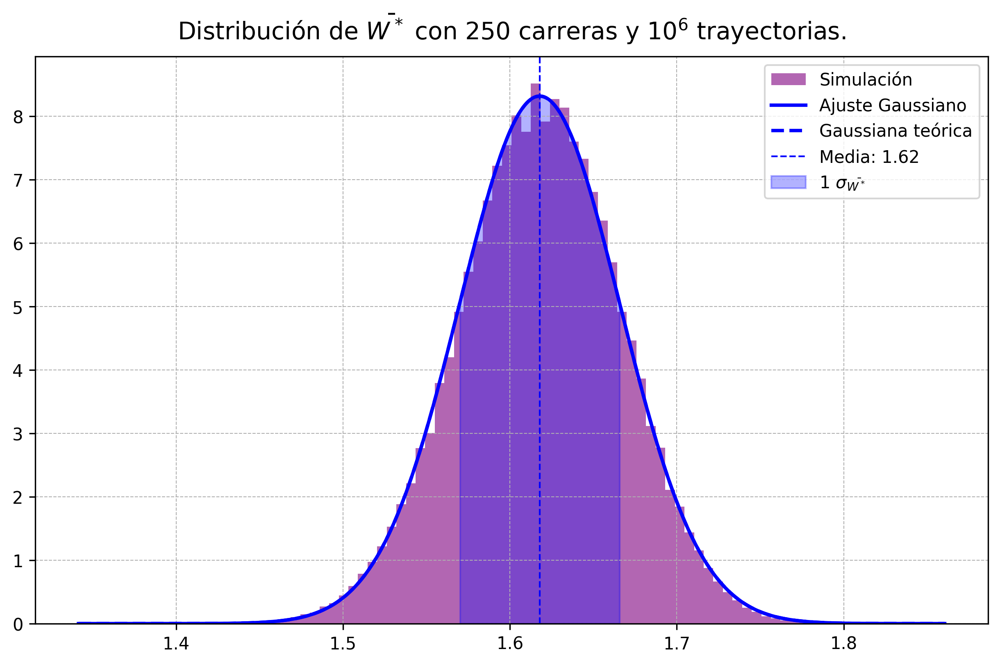

The average of the distribution is 1.6179 and the standard deviation is 0.0480.


In [31]:
# In order to study the distribution, let us take the value of the doubling rate after the last race. 

# Figure size
figure(figsize=(10, 6), dpi=300)

# Plot histogram
n, bins, patches = hist(log(wealth[:,-1])/N, bins=82, density=True, alpha=0.6, color='purple', label="Simulación")

# Plot Gaussian approximation
# Let us compute the standard deviation and mean
mu_2, sigma_2 = norm.fit(log(wealth[:,-1])/N) 
xmin, xmax = xlim()
xlin = linspace(xmin, xmax, 1000)
plot(xlin, norm.pdf(xlin, mu_2, sigma_2), color='blue', linewidth=2, label="Ajuste Gaussiano")

# Plot theoretical Gaussian
plot(xlin, norm.pdf(xlin, 1.6178526918185563, sqrt(0.57535148168029/250)), color='blue', linestyle='dashed', linewidth=2, label="Gaussiana teórica")

# Add vertical lines for means
axvline(x=1.6178526918185563, color='blue', linestyle='--',linewidth=1 ,label=f'Media: {1.6178526918185563:.2f}')

# Add horizontal lines for standard deviations
fill_between(xlin, 0, norm.pdf(xlin, 1.6178526918185563, sqrt(0.57535148168029/250)), where=((xlin > 1.6178526918185563 - sqrt(0.57535148168029/250)) & (xlin < 1.6178526918185563 + sqrt(0.57535148168029/250))), color='blue', alpha=0.3, label=r'1 $\sigma_{\bar{W^*}}$')

# Add grid, legend, title and adjust ticks for better readability
plt.title(r"Distribución de $\bar{W^*}$ con $250$ carreras y $10^6$ trayectorias.", fontsize=14,pad=10)
grid(True, which='both', linestyle='--', linewidth=0.5)
legend(fontsize=10)
xticks(fontsize=10)
yticks(fontsize=10)

# Show plot
show()

# Print the average and standard deviation of the distribution
print(f"The average of the distribution is {mu_2:.4f} and the standard deviation is {sigma_2:.4f}.")

A = 0.5751653699767252 ± 2.2486345601114138e-05


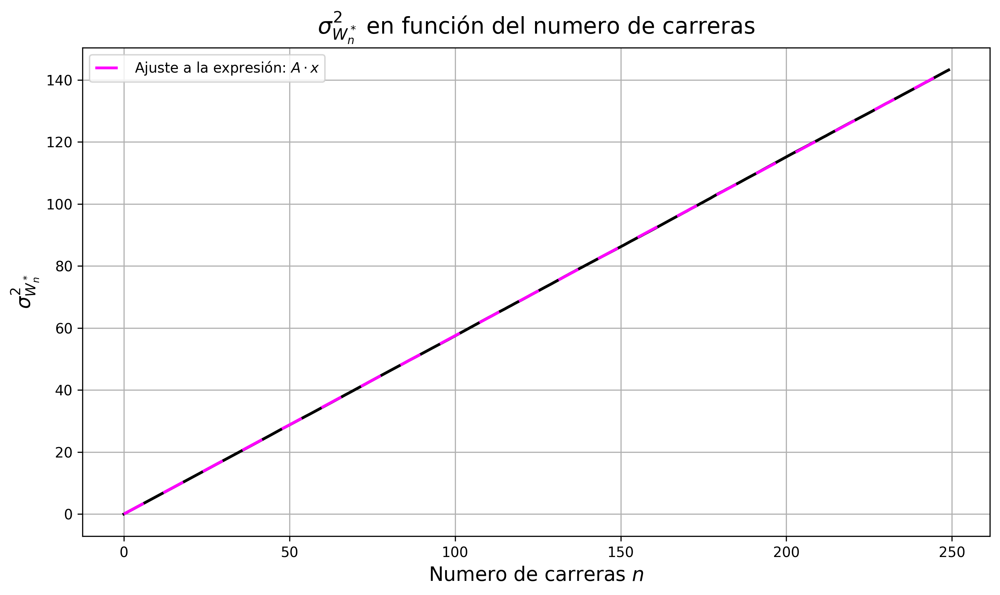

In [33]:
# Standard deviation squared as a fucntion of the cycles 
STD2=[] 

for i in range(N):
    STD2.append(std(log(wealth[:,i]))**2)

# Function used for the fitting
def f2(x,A):
    return A*x

# Results of the fitting
STDcomp2=arange(N)
popt2,cov2=curve_fit(f2,arange(N),STD2) 
A2=popt2[0]
stderr2 = sqrt(diag(cov2))
print(f"A = {A2} ± {stderr2[0]}")

# Graphical represenattion
figure(figsize=(10, 6), dpi=300)
x=arange(N)
plot(x,STD2,'black',linewidth=2)
plot(x,f2(x,A2),"--", color='magenta',label=r"Ajuste a la expresión: $A\cdot x$", linewidth=2, dashes=[8, 8])
legend()
xlabel("Numero de carreras $n$", fontsize=14)
ylabel(r"$\sigma_{W^*_{n}}^2$", fontsize=14)
plt.title(r"$\sigma_{W^*_{n}}^2$ en función del numero de carreras", fontsize=16,pad=10)
grid(True)
tight_layout()
show()

# 3) Channel Analogy

## 3.1) Optimum configuration same error (Binary Symmetric Channel)

In [18]:
# Mutual information function
def IXYC(E, eps):
    return 5 * (-(1/5 - E - 2*eps * (1/5 - 2 * E)) * log(1/5 - E - 2*eps * (1/5 - 2 * E)) - 
                (E + 2*eps * (1/5 - 2 * E)) * log(E + 2*eps * (1/5 - 2 * E))) + (
                2 * eps * log(eps) + (1 - 2 * eps) * log(1 - 2 * eps))

# First derivative of the mutual information with respect to pE 
def dIXYC(E, eps):
    return -5*(-1 + 4*eps)*log(1/5 - E - 2*eps*(1/5 - 2*E)) - 5*(1 - 4*eps)*log(E + 2*eps*(1/5 - 2*E))

# Second derivative of the mutual information with respect to pE
def d2IXYC(E, eps):
    return -5*(-1 + 4*eps)**2/(1/5 - E - 2*eps*(1/5 - 2*E)) - 5*(1 - 4*eps)**2/(E + 2*eps*(1/5 - 2*E))

# Create a grid of pE and epsilon values
pE = linspace(10**(-10), 1/5-10**(-10), 1000)
epsilon = linspace(10**(-10), 1/3, 1000)
pE_grid, epsilon_grid = meshgrid(pE, epsilon)

# Compute IXYC values over the grid
IXYC_values = vectorize(IXYC)(pE_grid, epsilon_grid)
dIXYC_values = vectorize(dIXYC)(pE_grid, epsilon_grid)
d2IXYC_values = vectorize(d2IXYC)(pE_grid, epsilon_grid)

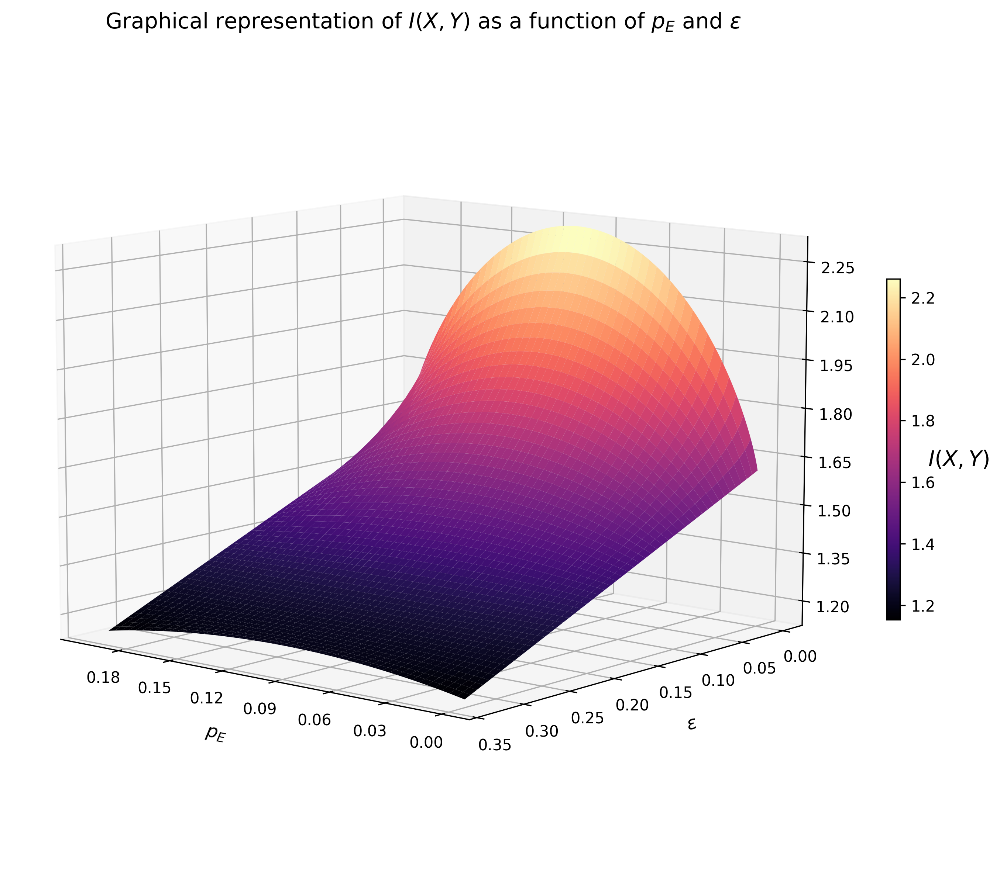

In [19]:
# Graphical representation of the mutual information
close('all')
fig = figure(figsize=(12, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')
surface3=ax.plot_surface(pE_grid, epsilon_grid, IXYC_values, cmap='magma')

# Set the viewing angle
ax.view_init(elev=10, azim=130)  
ax.set_xlabel(r'$p_E$',labelpad=10, fontsize=12)
ax.set_ylabel(r'$\epsilon$',labelpad=10, fontsize=12)
title = ax.set_title(r'Graphical representation of $I(X,Y)$ as a function of $p_E$ and $\epsilon$', fontsize=14)

cbar = fig.colorbar(surface3, ax=ax, shrink=0.4, aspect=25)
cbar.set_label(r"$I(X,Y)$",rotation=0, labelpad=15, fontsize=14)
ax.xaxis.set_major_locator(MaxNLocator(8))
ax.yaxis.set_major_locator(MaxNLocator(8))
ax.zaxis.set_major_locator(MaxNLocator(8))

show()

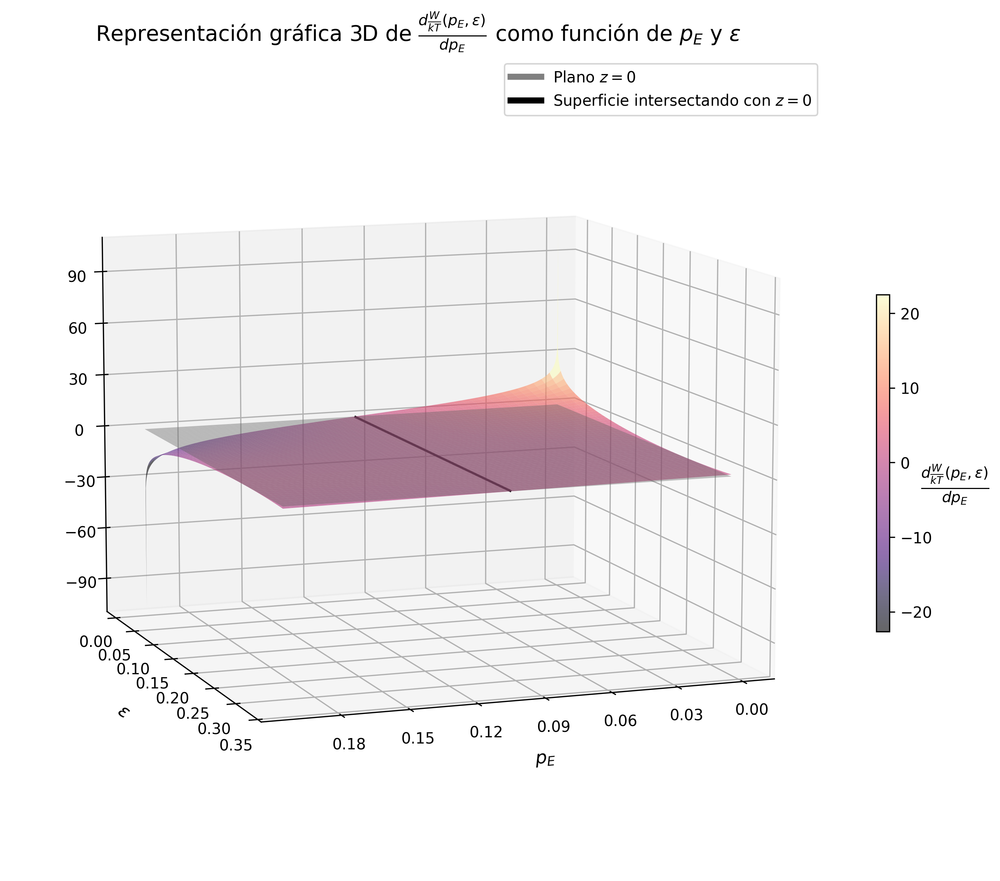

In [20]:
# 3D graphical representation of the first derivative of the mutual information
close('all')
fig = figure(figsize=(12, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Plotting the surface
surface4 = ax.plot_surface(pE_grid, epsilon_grid, dIXYC_values, cmap='magma',alpha=0.6)

# Add a contour plot on the z=0 plane
contours = ax.contour(pE_grid, epsilon_grid, dIXYC_values, levels=[0], zdir='z', offset=0, cmap='magma')

# Add a zero plane (reference plane at z=0)
ax.plot_surface(pE_grid, epsilon_grid, zeros_like(dIXYC_values), alpha=0.4, color='gray')

# Labels and title
ax.set_xlabel(r'$p_E$', labelpad=10, fontsize=12)
ax.set_ylabel(r'$\epsilon$', labelpad=10, fontsize=12)
ax.set_title(r'Representación gráfica 3D de $\frac{d\frac{W}{kT}(p_E, \epsilon)}{dp_E}$ como función de $p_E$ y $\epsilon$', fontsize=14,pad=10)

# Color bar for the surface
cbar = fig.colorbar(surface4, ax=ax, shrink=0.4, aspect=25)
cbar.set_label(r"$\frac{d\frac{W}{kT}(p_E, \epsilon)}{dp_E}$", rotation=0, labelpad=15, fontsize=14)

# View angle
ax.view_init(elev=10, azim=70)

# Adjust locator for axis
ax.xaxis.set_major_locator(MaxNLocator(8))
ax.yaxis.set_major_locator(MaxNLocator(8))
ax.zaxis.set_major_locator(MaxNLocator(8))

legend_elements = [
    Line2D([0], [0], color='gray', lw=4, label='Plano $z=0$'),
    Line2D([0], [0], color='black', lw=4, label='Superficie intersectando con $z=0$')
]
ax.legend(handles=legend_elements, loc='upper right')

show()


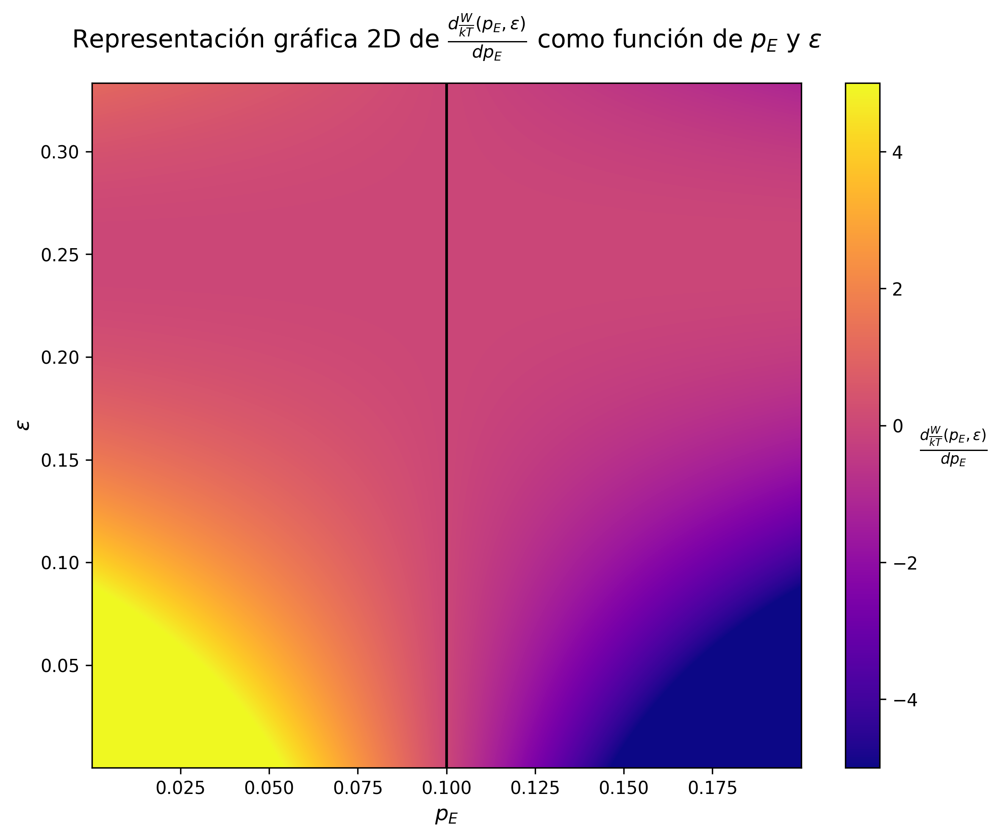

In [21]:
# 2D graphical representation of the first derivative of the mutual information

close('all')
fig, ax = subplots(figsize=(9, 7), dpi=300)

# Create the heatmap
c = ax.imshow(dIXYC_values, cmap='plasma', aspect='auto', origin='lower',
              extent=[pE_grid.min(), pE_grid.max(), epsilon_grid.min(), epsilon_grid.max()],vmin=-5, vmax=5)

# Add contour line where the function equals zero
# Note: contour needs the exact grid so we use pE_grid and epsilon_grid dimensions
contours = ax.contour(pE_grid, epsilon_grid, dIXYC_values, levels=[0], colors='black', linestyles='solid')

# Color bar for the heatmap
cbar = fig.colorbar(c, ax=ax)
cbar.set_label(r"$\frac{d\frac{W}{kT}(p_E, \epsilon)}{dp_E}$", rotation=0, fontsize=12,labelpad=20)
ax.set_title(r'Representación gráfica 2D de $\frac{d\frac{W}{kT}(p_E, \epsilon)}{dp_E}$ como función de $p_E$ y $\epsilon$', fontsize=14,pad=20)

# Labels and title
ax.set_xlabel(r'$p_E$', fontsize=12)
ax.set_ylabel(r'$\epsilon$', fontsize=12)

# Show the plot
show()

## 3.2) Optimum configuration different error (Binary Asymmetric Channel)

In [57]:
# Mutual information function
def IXYdelta(E, epsilon, f):
    return 5*((1/5 - E)*(2*epsilon*log(epsilon) + (1 - 2*epsilon)*log(1 - 2*epsilon)) + E*(2*log(f)*f + (1 - 2*f)*log(1 - 2*f)) - ((1 - 2*epsilon)*(1/5 - E) + 2*E*f)*log((1 - 2*epsilon)*(1/5 - E) + 2*E*f) - (2*epsilon*(1/5 - E) + (1 - 2*f)*E)*log(2*epsilon*(1/5 - E) + (1 - 2*f)*E))

# First derivative of the mutual information with respect to pE 
def dIXYdelta(E, epsilon, f):
    return -10*epsilon*log(epsilon) - 5*(1 - 2*epsilon)*log(1 - 2*epsilon) + 10*log(f)*f + 5*(1 - 2*f)*log(1 - 2*f) - 5*(-1 + 2*epsilon + 2*f)*log((1 - 2*epsilon)*(1/5 - E) + 2*E*f) - 5*(-2*epsilon - 2*f + 1)*log(2*epsilon*(1/5 - E) + (1 - 2*f)*E)

# Create a grid of pE and epsilon values
pE = linspace(10**(-10), 1/5-10**(-10), 1000)
epsilon = linspace(10**(-10), 1/3, 1000)
pE_grid, epsilon_grid = meshgrid(pE, epsilon)

# Compute values over the grid
IXYdelta = vectorize(IXYdelta)(pE_grid,0.1,epsilon_grid)
dIXYdelta = vectorize(dIXYdelta)(pE_grid,0.1, epsilon_grid)

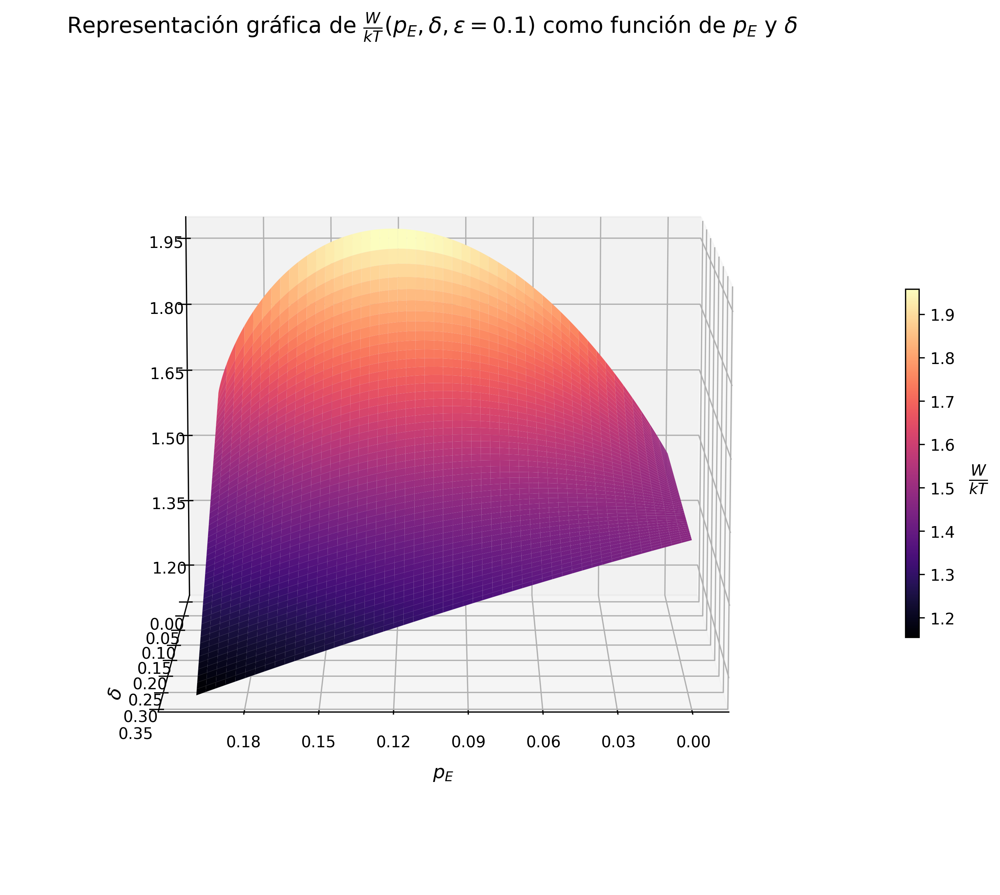

In [49]:
# Graphical representation of the mutual information
close('all')
fig = figure(figsize=(12, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')
surface5=ax.plot_surface(pE_grid, epsilon_grid, IXYdelta, cmap='magma')

# Set the viewing angle
ax.view_init(elev=10, azim=90)  
ax.set_xlabel(r'$p_E$',labelpad=10, fontsize=12)
ax.set_ylabel(r'$\delta$',labelpad=10, fontsize=12)
title = ax.set_title(r'Representación gráfica de $\frac{W}{kT}(p_E, \delta, \epsilon=0.1)$ como función de $p_E$ y $\delta$', fontsize=14)

cbar = fig.colorbar(surface5, ax=ax, shrink=0.4, aspect=25)
cbar.set_label(r"$\frac{W}{kT}$",rotation=0, labelpad=15, fontsize=14)

ax.xaxis.set_major_locator(MaxNLocator(8))
ax.yaxis.set_major_locator(MaxNLocator(8))
ax.zaxis.set_major_locator(MaxNLocator(8))

show()

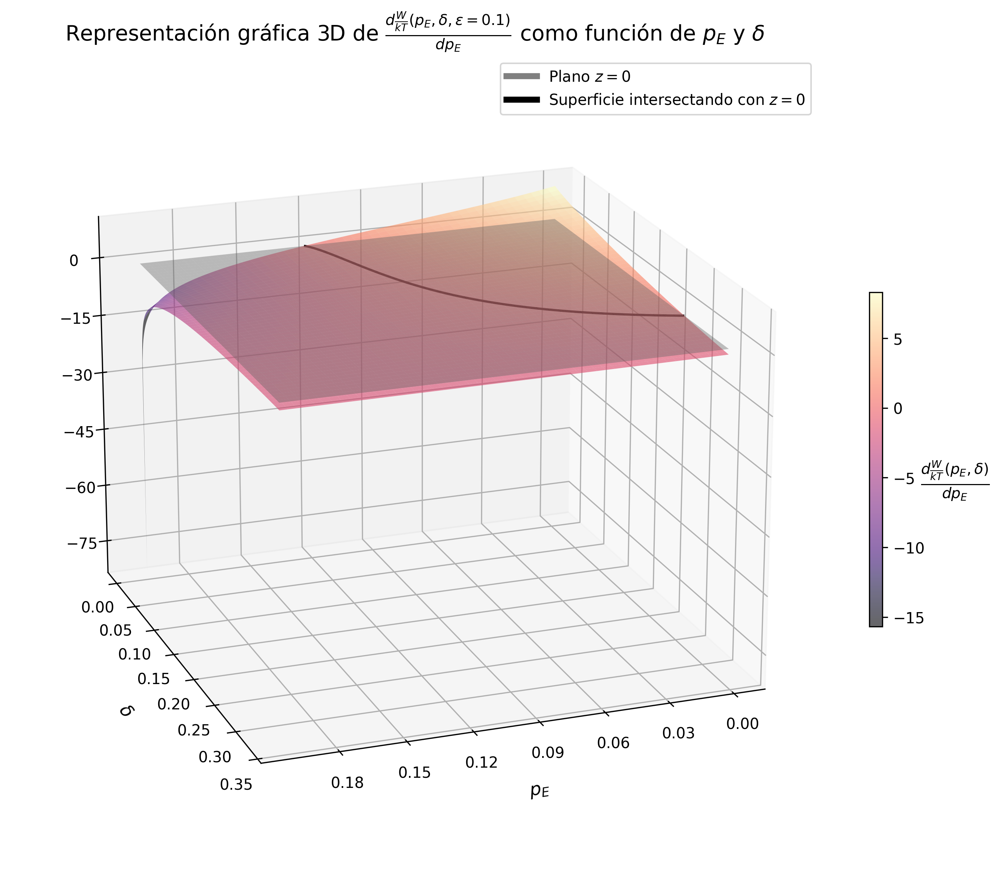

In [50]:
# 3D graphical representation of the first derivative of the mutual information

close('all')
fig = figure(figsize=(12, 10), dpi=300)
ax = fig.add_subplot(111, projection='3d')

# Plotting the surface
surface6 = ax.plot_surface(pE_grid, epsilon_grid, dIXYdelta, cmap='magma',alpha=0.6)

# Add a contour plot on the z=0 plane
contours = ax.contour(pE_grid, epsilon_grid, dIXYdelta, levels=[0], zdir='z', offset=0, cmap='magma')

# Add a zero plane (reference plane at z=0)
ax.plot_surface(pE_grid, epsilon_grid, zeros_like(dIXYdelta), alpha=0.4, color='gray')

# Customize labels and title
ax.set_xlabel(r'$p_E$', labelpad=10, fontsize=12)
ax.set_ylabel(r'$\delta$', labelpad=10, fontsize=12)
ax.set_title(r'Representación gráfica 3D de $\frac{d\frac{W}{kT}(p_E, \delta, \epsilon=0.1)}{dp_E}$ como función de $p_E$ y $\delta$', fontsize=14,pad=10)

# Color bar for the surface
cbar = fig.colorbar(surface6, ax=ax, shrink=0.4, aspect=25)
cbar.set_label(r"$\frac{d\frac{W}{kT}(p_E, \delta)}{dp_E}$", rotation=0, labelpad=20, fontsize=14)

# View angle
ax.view_init(elev=20, azim=70)

# Adjust locator for axis
ax.xaxis.set_major_locator(MaxNLocator(8))
ax.yaxis.set_major_locator(MaxNLocator(8))
ax.zaxis.set_major_locator(MaxNLocator(8))

legend_elements = [
    Line2D([0], [0], color='gray', lw=4, label='Plano $z=0$'),
    Line2D([0], [0], color='black', lw=4, label='Superficie intersectando con $z=0$')
]
ax.legend(handles=legend_elements, loc='upper right')

show()

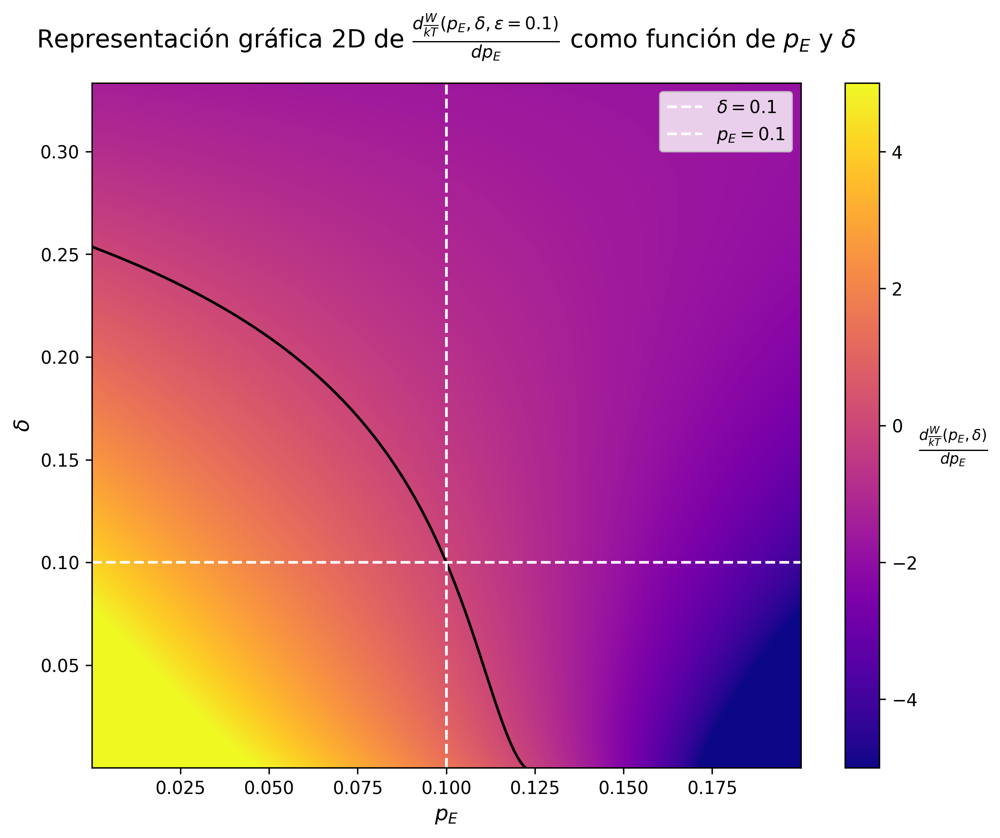

In [51]:
# 2D graphical representation of the first derivative of the mutual information

close('all')
fig, ax = subplots(figsize=(9, 7), dpi=300)

# Create the heatmap
c = ax.imshow(dIXYdelta, cmap='plasma', aspect='auto', origin='lower',
              extent=[pE_grid.min(), pE_grid.max(), epsilon_grid.min(), epsilon_grid.max()],vmin=-5, vmax=5)

# Add contour line where the function equals zero
# Note: contour needs the exact grid so we use pE_grid and epsilon_grid dimensions
contours = ax.contour(pE_grid, epsilon_grid, dIXYdelta, levels=[0], colors='black', linestyles='solid')

# Color bar for the heatmap
cbar = fig.colorbar(c, ax=ax)
cbar.set_label(r"$\frac{d\frac{W}{kT}(p_E, \delta)}{dp_E}$", rotation=0, fontsize=12,labelpad=20)

# Customize labels and title
ax.set_xlabel(r'$p_E$', fontsize=12)
ax.set_ylabel(r'$\delta$', fontsize=12)
ax.set_title(r'Representación gráfica 2D de $\frac{d\frac{W}{kT}(p_E,\delta ,\epsilon=0.1)}{dp_E}$ como función de $p_E$ y $\delta$', fontsize=14,pad=20)

ax.axhline(y=0.1, color='white', linestyle='--', label=r'$\delta=0.1$')
ax.axvline(x=0.1, color='white', linestyle='--', label=r'$p_E=0.1$')

# Add legend to indicate the lines
ax.legend()

# Show the plot
show()